<a href="https://colab.research.google.com/github/irenaijacic/PPPO_projekat_klasifikacija/blob/main/Projekat_za_PPPO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1><b>Klasifikacija Lego Dataset-a</h1>


**Klasifikacija** je proces grupisanja ili razvrstavanja objekata u različite kategorije ili klase na osnovu njihovih karakteristika ili osobina.

Klasifikacija uključuje izgradnju modela na osnovu trening skupa podataka koji sadrže objekte sa poznatim klasama. Model se zatim koristi za predviđanje klasa novih, neviđenih objekata na osnovu njihovih karakteristika.

Različite metode se koriste za klasifikaciju, uključujući metode nadgledanog i nenadgledanog učenja. U nadgledanom učenju, model se trenira na podacima koji su označeni sa tačnim klasama, dok se u nenadgledanom učenju model samo pokušava otkriti prirodne strukture i odnose u podacima bez prethodnih oznaka klasa. U našem primjeru radi se o nadgledanom učenju jer radimo sa podacima koji jesu prethodno označeni po klasama.

Cilj ovog rada jeste vršenje klasifikacije slika koje predstavljaju lego kockice. Uz pomoć Transfer Learning-a i korišćenja unaprijed pretreniranih mreža, krajnji rezultat će nam dati mogućnost da prilikom prosljeđivanja neke nove slike koja pripada nekoj od datih klasa, kojih u podacima koji su nam dodjeljeni ima 37, naš model će nam tačno odrediti kojoj od datih klasa pripada figurica sa slike, na osnovu njenog izgleda.


<h2><b>Biblioteke potrebne za rad</h2>


Od biblioteka potrebne su nam neke standardne za izvršavanje ovakve vrste zadatka, kao što su numpy, pandas, tensorflow...

**NumPy** je skraćenica za Numerical Python. NumPy je Python biblioteka koja pruža podršku za rad sa višedimenzionalnim nizovima.

Takođe, sadrži funkcije za rad u području linearne algebre, kao i matrica.

**Pandas**  je Python paket otvorenog koda koji se najviše koristi za zadatke data science, analize podataka i mašinskog učenja. On je izgrađen na  paketu koji je prethodno objašnjen, Numpy.

**Tensorflow** TensorFlow je biblioteka otvorenog koda namenjena brzom numeričkom računanju.
Može se pokretati na jednostrukim CPU sistemima i GPU-ima, kao i na mobilnim uređajima i velikim distribuiranim sistemima sa stotinama mašina.TensorFlow je postao izuzetno popularan u zajednici istraživača i praktičara mašinskog učenja zbog svoje moćne i fleksibilne arhitekture, bogate dokumentacije i aktivne zajednice korisnika.

**Biblioteka PIL (Python Imaging Library)** je popularna biblioteka otvorenog koda koja pruža mogućnosti za manipulaciju slikama u programskom jeziku Python.

U ovom radu se koristi za import klase Image iz PIL biblioteke. Klasa Image omogućava rad sa slikama, kao što su otvaranje slika, manipulacija njihovim sadržajem, primena filtera, konverzija formata slike i još mnogo toga.



In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
import cv2
import os

import tensorflow as tf
from tensorflow.keras.applications import mobilenet_v2 as tf_mobilenet_v2
from tensorflow.keras import layers,models
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Flatten,Dropout, Dense,GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet50
from PIL import Image



from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import matplotlib.image as mpimg


**Podaci za rad**


Set podataka se sastoji od 5 foldera:

marvel,
harry-potter,
star-wars,
jurassic-world i
test.

Pored toga tu su još i index.csv, metadata.csv i test.csv.


Linije koje slijede se odnose na učitavanje podataka sa drajva u Google Colab.
Kada se podaci učitavaju na način kako je prikazano u narednoj ćeliji, onda oni dobiju neki random naziv. Zbog toga je dodata jedna dodatna ćelija u kojoj date podatke stavljamo u zip fajl sa nazivom myDataset, a onda te taj zip fajl raspakujemo.


In [7]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://drive.google.com/file/d/1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk/view?usp=sharing' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk"


--2023-07-05 18:50:45--  https://docs.google.com/uc?export=download&confirm=&id=1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk
Resolving docs.google.com (docs.google.com)... 142.251.170.139, 142.251.170.138, 142.251.170.113, ...
Connecting to docs.google.com (docs.google.com)|142.251.170.139|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-04-10-docs.googleusercontent.com/docs/securesc/i337vs27evjahg1eucjg6ffa4p59f7h5/fbvshobois2kqav7134fdrb8sknku5of/1688583000000/12172178362461080244/10476967311448890900Z/1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk?e=download&uuid=c0cce1f1-6ee5-490a-906e-6e6c75f91358 [following]
--2023-07-05 18:50:45--  https://doc-04-10-docs.googleusercontent.com/docs/securesc/i337vs27evjahg1eucjg6ffa4p59f7h5/fbvshobois2kqav7134fdrb8sknku5of/1688583000000/12172178362461080244/10476967311448890900Z/1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk?e=download&uuid=c0cce1f1-6ee5-490a-906e-6e6c75f91358
Resolving doc-04-10-docs.googleusercontent.com (doc-04-10-docs


Slijedi preusmjeravanje podataka preuzetih sa drajva i unzip istih.


In [8]:

!pip install gdown
import gdown

url = 'https://docs.google.com/uc?export=download&id=1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk'
output = 'myDataset.zip'
gdown.download(url, output, quiet=False)


Downloading...
From: https://docs.google.com/uc?export=download&id=1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk
To: /content/myDataset.zip
100%|██████████| 30.2M/30.2M [00:00<00:00, 216MB/s]


'myDataset.zip'

In [9]:
!unzip myDataset.zip

Archive:  myDataset.zip
replace LICENSE? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


**Analiza dataseta**

U narednih par čelija izvršena je neka osnovna analiza podataka, čisto da bismo imali uvid u to sa koliko slika raspolažemo, u koliko podfoldera su one smještene u okviru ova naša 4 osnovna foldera: marvel, harry-potter, star-wars i jurassic-world.

In [10]:
folders = ['marvel', 'harry-potter', 'star-wars', 'jurassic-world']
counts = {}

for folder in folders:
    folder_path = f'/content/{folder}'
    if os.path.exists(folder_path):
        count = len(os.listdir(folder_path))
        counts[folder] = count
    else:
        counts[folder] = 0

print("Broj foldera u svakom direktoriju:")
for folder, count in counts.items():
    print(f"{folder}: {count}")

Broj foldera u svakom direktoriju:
marvel: 17
harry-potter: 2
star-wars: 17
jurassic-world: 2


Ukupan broj slika na kojima ćemo trenirati model

In [11]:
total_count = 0

for folder in folders:
    folder_path = f'/content/{folder}'
    if os.path.exists(folder_path):
        count = sum([len(files) for _, _, files in os.walk(folder_path)])
        total_count += count

print(f"Ukupan broj slika u svim direktorijima: {total_count}")


Ukupan broj slika u svim direktorijima: 415


Provjera da li su sve slike sa kojim radimo istog oblika i ukoliko jesu koji je oblik u pitanju. Iz rezultata vidimo da su sve slike istog oblika, dimenzija 512x512 piksela (dužina x širina), a broj 3 nam govori da se radi o slikama sa 3 kanala boje(RGB)

In [12]:

shape_same = True
first_shape = None

for folder in folders:
    folder_path = f'/content/{folder}'
    if os.path.exists(folder_path):
        for root, _, files in os.walk(folder_path):
            for file in files:
                image_path = os.path.join(root, file)
                try:
                    image = cv2.imread(image_path)
                    count += 1
                    if first_shape is None:
                        first_shape = image.shape
                    elif image.shape != first_shape:
                        shape_same = False
                except:
                    print(f"Greska pri citanju slike: {image_path}")
    else:
        print(f"Folder '{folder_path}' ne postoji.")

if shape_same:
    print(f"Svi oblici slika su isti: {first_shape}")
else:
   print("Oblici slika nisu isti među svim slikama.")



Svi oblici slika su isti: (512, 512, 3)


Učitavanje podataka iz csv fajlova, a to su index.csv i metadata.csv
Metadata.csv je morao biti učitan na drugačiji način zbog svog formata.
Ono što je bitno jeste to da u oba ova csv fajla imamo kolonu class_id, po kojoj onda vršimo spajanje fajlova, odnosno na osnovu datog class_id dodjeljujemo nazive koje čitamo iz matadata fajla, a to su nazivi lego minifigura.

In [13]:
index_data = pd.read_csv('index.csv')
index_data

,path,class_id
0,marvel/0001/001.jpg,1
1,marvel/0001/002.jpg,1
2,marvel/0001/003.jpg,1
3,marvel/0001/004.jpg,1
4,marvel/0001/005.jpg,1
...,...,...
366,star-wars/0017/006.jpg,38
367,star-wars/0017/007.jpg,38
368,star-wars/0017/008.jpg,38
369,star-wars/0017/009.jpg,38


Ovdje prikazujemo i koliki je ukupan broj klasa



In [14]:
metadata_data = pd.read_csv('metadata.csv', encoding='latin-1')
n_classes = metadata_data.shape[0]
print("Ukupan broj klasa: ", n_classes)
metadata_data

Ukupan broj klasa:  38


,class_id,lego_ids,lego_names,minifigure_name
0,1,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
1,2,[76115],['Spider Mech vs. Venom'],VENOM
2,3,[76115],['Spider Mech vs. Venom'],AUNT MAY
3,4,[76115],['Spider Mech vs. Venom'],GHOST SPIDER
4,5,[75208],"[""Yoda's Hut""]",YODA
5,6,[75208],"[""Yoda's Hut""]",LUKE SKYWALKER
6,7,[75208],"[""Yoda's Hut""]",R2-D2
7,8,[75199],"[""General Grievous' Combat Speeder""]",MACE WINDU
8,9,[75199],"[""General Grievous' Combat Speeder""]",GENERAL GRIEVOUS
9,10,[75264],"[""Kylo Ren's Shuttle Microfighter""]",KYLO REN


U okviru promjenljive data čuvamo sada podatke koje dobijamo spajanjem ova dva prethodno učitana fajla, kako je to ranije  objašnjeno.

In [15]:
data = pd.merge(index_data, metadata_data[['class_id', 'minifigure_name']], on='class_id')
data

,path,class_id,minifigure_name
0,marvel/0001/001.jpg,1,SPIDER-MAN
1,marvel/0001/002.jpg,1,SPIDER-MAN
2,marvel/0001/003.jpg,1,SPIDER-MAN
3,marvel/0001/004.jpg,1,SPIDER-MAN
4,marvel/0001/005.jpg,1,SPIDER-MAN
...,...,...,...
366,star-wars/0017/006.jpg,38,BOBA FETT
367,star-wars/0017/007.jpg,38,BOBA FETT
368,star-wars/0017/008.jpg,38,BOBA FETT
369,star-wars/0017/009.jpg,38,BOBA FETT


Prikaz 3 slike iz klase sa id 2, gdje se prikazuje sam izgled slika, kao i ispis naziva te klase koji dobijamo na osnovu povezivanja podataka, kako je prethodno objašnjeno.

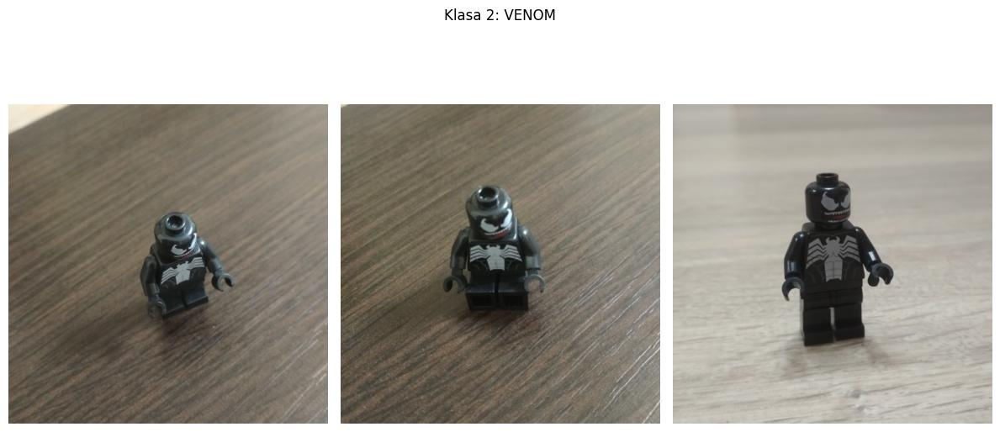

In [16]:
fig, axs = plt.subplots(1, 3, figsize=(12, 6))

filtered_data_class3 = data[data['class_id'] == 2]

for i, (_, row) in enumerate(filtered_data_class3.head(3).iterrows()):
    img_path = row['path']
    img = plt.imread(img_path)
    axs[i].imshow(img)
    axs[i].axis('off')

class_id = 2
class_name = filtered_data_class3['minifigure_name'].iloc[0]
title = f"Klasa {class_id}: {class_name}"
plt.suptitle(title)

plt.tight_layout()
plt.show()


Zatim, uzimamo 20 nasumičnih slika, a onda od tih 20 prikazujemo 12 slika, s tim da ovaj put ne određujemo koja je klasa iz koje uzimamo slike, već slike pripadaju različitim klasama, a ispod svake slike je naveden naziv klase kojoj pripada.

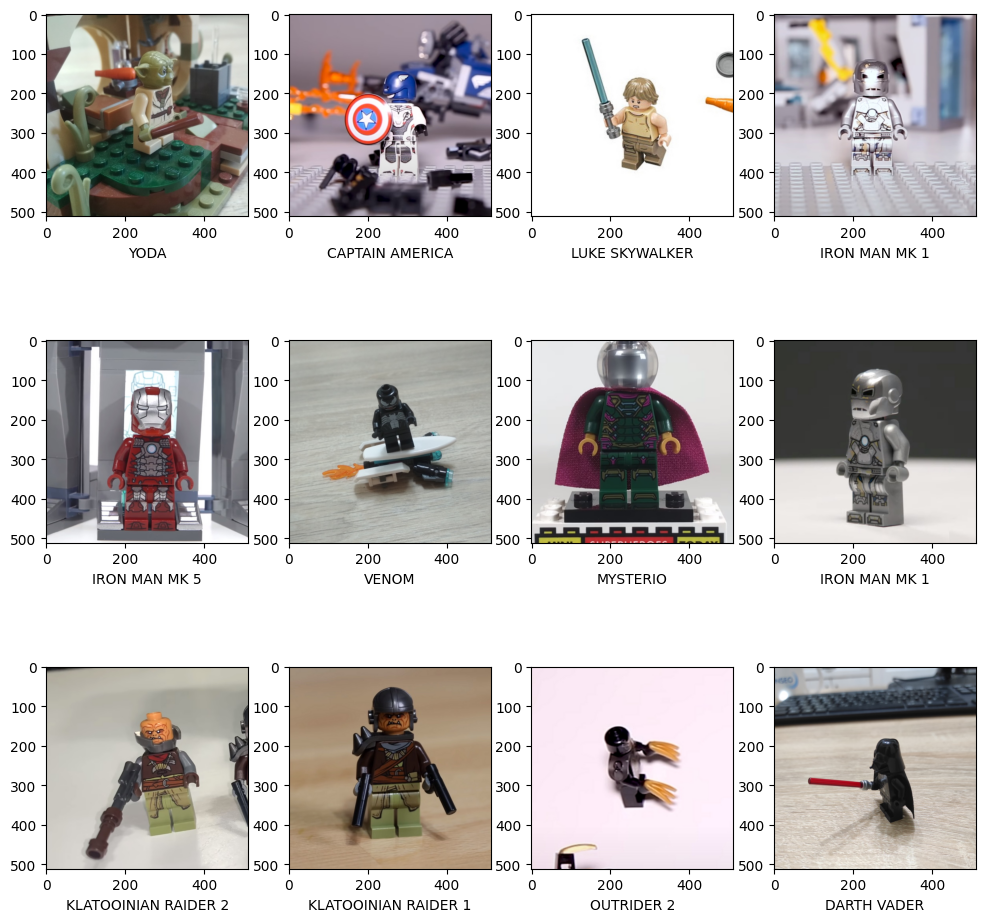

In [17]:
sample_df = data.sample(20)
plt.figure(figsize=(12, 12))
for i in range(12):
    plt.subplot(3, 4, i + 1)
    plt.grid(False)
    img = Image.open(sample_df['path'].values[i])
    plt.imshow(img)
    plt.xlabel(sample_df['minifigure_name'].values[i])

plt.show()

Grafički prikaz pomoću plotly.express biblioteke. Grafički prikazujemo koliko je figura u svakoj od navedenih klasa

In [18]:
import plotly.express as px

df_minifigure_name = data['minifigure_name'].value_counts().reset_index()
df_minifigure_name.columns = ['minifigure_name', 'Count']
df_minifigure_name = df_minifigure_name.sort_values('Count', ascending=False)

fig = px.bar(
    df_minifigure_name,
    x='minifigure_name',
    y='Count',
    text='Count',
    color='Count',
    color_continuous_scale='greens'
)

fig.update_layout(
    title='Broj minifigura po klasama',
    xaxis_title='Naziv',
    yaxis_title='Broj',
    title_x=0.5,
    plot_bgcolor='rgb(255, 255, 204)'
)

fig.show()


<h1><b>Podjela podataka na podatke za trening, validaciju i test</h1>



Sada je potrebno podjeliti podatke sa kojima radimo na one za trening, da bismo već unaprijed istreniranu mrežu koristili na našem setu podataka. Dosta popularno mišljenje jeste da je ResNet50 mreža koja je itekako pogodna za klasifikaciju ove vrste, tako da ćemo iskoristiti tu mrežu.
Pored podataka koje smo ranije pominjali i analizirali sadržaj ona 4 glavna foldera, tu je još i folder sa testnim slikama, kao i test.csv fajl. Naš zadatak jeste podjeliti testne podatke na x_test i y_test. Obično je praksa takva da se u okviru y_test čuvaju oni podaci koje želimo da predvidimo, a u našem slučaju je to klasa kojoj pripada slika, tako da ćemo u y_test čuvati vrijednosti class_id.



In [19]:
test = pd.read_csv('test.csv')


x_test = test.drop('class_id', axis=1)
y_test = test['class_id']


test_actual = test.merge(metadata_data[['class_id', 'minifigure_name']], on='class_id')
test_actual = test_actual.sort_values('path')



Kao što smo podjelili testne podatke na x_test i y_test, tako sada dijelimo i podatke za trening na one koji sadrže sve bitne osobine, bez one koju predviđamo - x_data, i y_data, koji sadrži ciljnu varijablu koju predviđamo.

In [20]:
X_data = data.drop('class_id', axis=1)
y_data = data['class_id']

x_train, x_validation, y_train, y_validation = train_test_split(
    X_data, y_data, test_size=0.3, random_state=8,stratify=y_data
)


In [21]:
X_data

,path,minifigure_name
0,marvel/0001/001.jpg,SPIDER-MAN
1,marvel/0001/002.jpg,SPIDER-MAN
2,marvel/0001/003.jpg,SPIDER-MAN
3,marvel/0001/004.jpg,SPIDER-MAN
4,marvel/0001/005.jpg,SPIDER-MAN
...,...,...
366,star-wars/0017/006.jpg,BOBA FETT
367,star-wars/0017/007.jpg,BOBA FETT
368,star-wars/0017/008.jpg,BOBA FETT
369,star-wars/0017/009.jpg,BOBA FETT


Slijedi prikaz nekih od testnih slika.


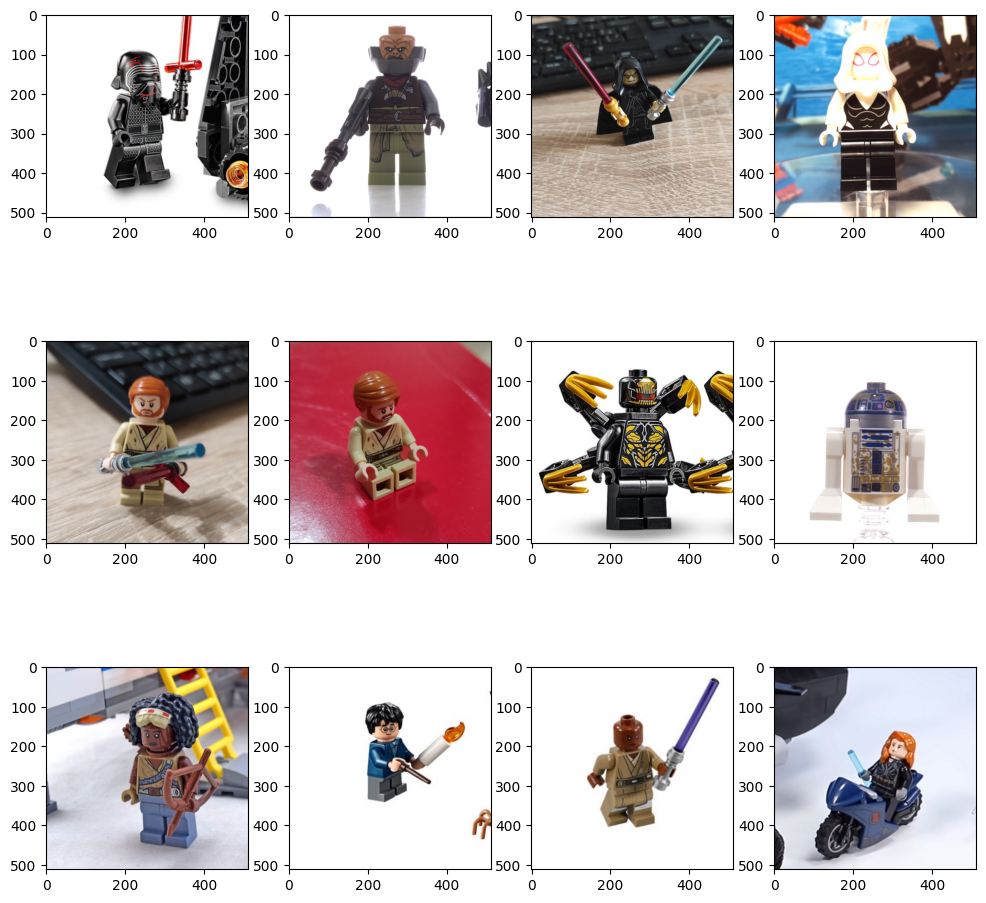

In [22]:
sample_df = test_actual.sample(20)
plt.figure(figsize=(12, 12))
for i in range(12):
    plt.subplot(3, 4, i + 1)
    plt.grid(False)
    img = Image.open(sample_df['path'].values[i])
    plt.imshow(img)


plt.show()

In [23]:
print("Najmanja vrijednost u y_train:", min(y_validation))

Najmanja vrijednost u y_train: 1


Potrebno je slike na određeni način obraditi. U narednoj ćeliji je odrađen odgovarajuća promjena oblika slika, odnosno sve slike su postavljene na dimenziju (224,224) pošto nam je ova dimenzija potrebna za rad sa modelima kasnije. Takođe, odrađuje se boja i vrši se normalizacija, gdje se dijele sa 255, tako da sve vrijednosti iznose 0-1.
Takođe, za y_train i y_val oduzmemo 1, pošto želimo da numerisanje krene od 0, a ne od 1, kako je to trenutno slučaj. To potvrđuje i prethodna ćelija koda.

In [24]:
def preprocess_images(X):
    X_converted = np.zeros((X.shape[0], 224, 224, 3))
    for i in range(X.shape[0]):
        image = cv2.imread(X["path"].values[i])
        image = cv2.resize(image, dsize=(224,224))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        X_converted[i] = image / 255
    return X_converted

x_train_converted = preprocess_images(x_train)
y_train_converted = np.array(y_train) - 1 #numerisanje krece od 0

x_val_converted = preprocess_images(x_validation)
y_val_converted = np.array(y_validation) - 1

x_test_converted = preprocess_images(x_test)
y_test_converted = np.array(y_test)

In [ ]:
'''
Ovaj dio koda je zakomentarisan jer nisam uspjela do kraja da realizujem augmentaciju, ali ovdje je dat čisto primjer kako bi to moglo izgledati
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def augmentation(x_train):
    datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.2,
        horizontal_flip=True,
        brightness_range=[0.8, 1.2]
    )

    datagen.fit(x_train)

    augmented_images = datagen.flow(x_train, shuffle=False).next()

    augmented_images = np.concatenate((x_train, augmented_images))

    return augmented_images
'''

<h1> <b> ResNet50 </h1>

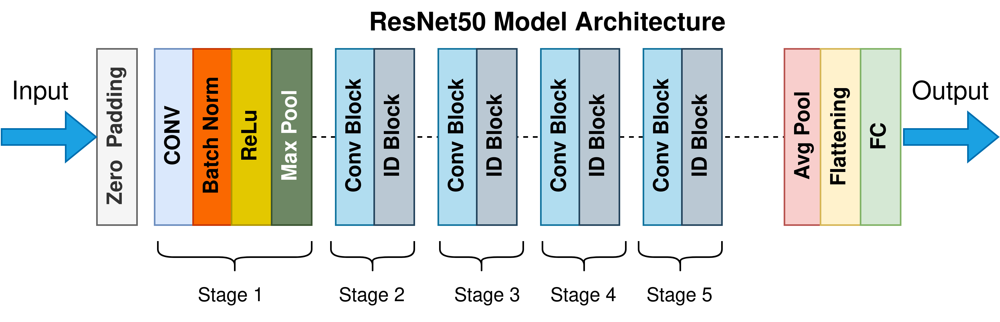

ResNet predstavlja "Residual Network" i specifičan je tip konvolucijske neuronske mreže (CNN) koji je predstavljen u radu iz 2015. godine pod nazivom "Duboko rezidualno učenje za prepoznavanje slika" autora He Kaiminga, Zhang Xiangyua, Rena Shaoqinga i Sun Jiana. CNN se često koriste za različite aplikacije računalnog vida.

ResNet-50 je konvolucijska neuronska mreža sa 50 slojeva (48 konvolucijskih slojeva, jedan sloj MaxPool i jedan sloj srednjeg poolinga). Rezidualne neuronske mreže su tip neuronskih mreža koje formiraju mreže tako što grupišu rezidualne blokove.

U ResNet-50 arhitekturi postoje dve vrste blokova:

**Blok identiteta**(Identity Block)

**Konvolucijski blok** (Convolutional Block)

Vrednost 'x' se dodaje izlaznom sloju samo ako je dimenzija ulaza jednaka dimenziji izlaza.

Ukoliko to nije slučaj, dodaje se "konvolucijski blok" u skraćeni put kako bi se dimenzija ulaza izjednačila sa dimenzijom izlaza.

**Kreiranje modela**

Kreira se model ResNet50 sa dodatim slojevima za klasifikaciju slika.
Prvo se kreira prazan model. Zatim  se učitava prethodno obučen model ResNet50, koji je prethodno obučen na velikom skupu slika ImageNet. Ovaj model se koristi kao osnova za novu neuronsku mrežu prilagođenu potrebama projektnog zadatka. Težinski parametri svih slojeva koji su prethodno obučeni će biti fiksirani tokom treninga naše nove mreže, a mi dodajemo nove slojeve.

In [25]:

def create_model():

  modelResnet = Sequential()

  pretrained_model= tf.keras.applications.ResNet50(include_top=False,
                    weights='imagenet',
                    input_shape=(224, 224, 3),
                    pooling='avg')

  for layer in pretrained_model.layers:
          layer.trainable=False



  number_of_classes = len(data['class_id'].unique())

  modelResnet.add(pretrained_model)
  modelResnet.add(tf.keras.layers.BatchNormalization())
  modelResnet.add(tf.keras.layers.Flatten())
  modelResnet.add(tf.keras.layers.Dense(512, activation='relu'))
  modelResnet.add(tf.keras.layers.Dense(number_of_classes, activation='softmax'))

  return modelResnet


In [26]:
modelResnet = create_model()

modelResnet.summary()

94765736/94765736 [==============================] - 4s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 batch_normalization (BatchN  (None, 2048)             8192      
 ormalization)                                                   
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 512)               1049088   
                                                                 
 dense_1 (Dense)             (None, 38)                19494     
                                                                 
Total params: 24,664,486
Trainable params: 1,072,678
Non-

**Kompajliranje modela**

In [27]:
modelResnet.compile(
    optimizer=Adam(0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)


Dodavanje early_stopping i learining_rate_reduction.

**EarlyStopping** je povratna informacija koja zaustavlja treniranje modela prije nego što dostigne zadovoljavajuće rezultate. Parametri monitor='val_loss' i mode='max' znače da će se pratiti gubitak (loss) na validacionom skupu i tražiti maksimizaciju tog gubitka. Parametar patience=5 označava da će se model zaustaviti nakon 5 uzastopnih epoha bez poboljšanja. Postavljanje restore_best_weights=True znači da će se vratiti najbolje težine modela nakon zaustavljanja.

**ReduceLROnPlateau** je povratna informacija koja smanjuje stopu učenja (learning rate) modela kada se metrika praćenja, u ovom slučaju "accuracy" na trening skupu, prestane poboljšavati. Parametri factor=0.5 i patience=3 znače da će se stopa učenja smanjiti za faktor 0.5 nakon 3 uzastopne epohe bez poboljšanja. Postavljanje verbose=0 znači da neće biti prikaza poruka o smanjenju stope učenja. Parametar min_lr=0.0001 postavlja donju granicu za stopu učenja.

In [28]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_loss', mode='max', patience=5,  restore_best_weights=True)

learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau( monitor = "accuracy", factor = 0.5, patience = 3, verbose = 0, min_lr = 0.0001 )
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, verbose=1)

**Treniranje modela**

Za trening modela odabrano je 30 epoha. Batch_size (veličina paketa) u kontekstu mašinskog učenja predstavlja broj uzoraka (primjera) koji se koristi za ažuriranje modela tokom postupka učenja. Umjesto da koristimo cijeli skup podataka odjednom, podaci se dijele na manje grupe ili pakete, pri čemu svaki paket sadrži određeni broj uzoraka, u našem slučaju 10.

In [29]:

hist=modelResnet.fit(x_train_converted, y_train_converted, validation_data=(x_val_converted, y_val_converted), batch_size = 10, epochs=30, callbacks=[early_stopping, learning_rate_reduction])


Epoch 1/30
26/26 [==============================] - 97s 4s/step - loss: 3.6649 - accuracy: 0.0425 - val_loss: 3.8625 - val_accuracy: 0.0357 - lr: 1.0000e-04
Epoch 2/30
26/26 [==============================] - 87s 3s/step - loss: 3.2893 - accuracy: 0.1390 - val_loss: 3.7520 - val_accuracy: 0.0268 - lr: 1.0000e-04
Epoch 3/30
26/26 [==============================] - 69s 3s/step - loss: 3.0478 - accuracy: 0.2124 - val_loss: 3.6821 - val_accuracy: 0.0357 - lr: 1.0000e-04
Epoch 4/30
26/26 [==============================] - 89s 3s/step - loss: 2.8592 - accuracy: 0.2973 - val_loss: 3.6344 - val_accuracy: 0.0268 - lr: 1.0000e-04
Epoch 5/30
26/26 [==============================] - 68s 3s/step - loss: 2.7088 - accuracy: 0.3591 - val_loss: 3.5849 - val_accuracy: 0.0446 - lr: 1.0000e-04
Epoch 6/30
26/26 [==============================] - 88s 3s/step - loss: 2.5551 - accuracy: 0.4131 - val_loss: 3.5398 - val_accuracy: 0.0536 - lr: 1.0000e-04
Epoch 7/30
26/26 [==============================] - 90s 3s

In [30]:

loss, accuracy = modelResnet.evaluate(x_val_converted, y_val_converted, verbose=1)

print('Test loss:', loss)
print('Test accuracy:', accuracy)

4/4 [==============================] - 24s 6s/step - loss: 2.7212 - accuracy: 0.2500
Test loss: 2.7212233543395996
Test accuracy: 0.25


Slijedi grafički prikaz tačnosti i gubitka. Predstavljen je na validacionim i trening podacima da možemo pratiti kako su se vrijednosti mijenjale tokom vremena, odnosno kako je trening odmicao na epohama.

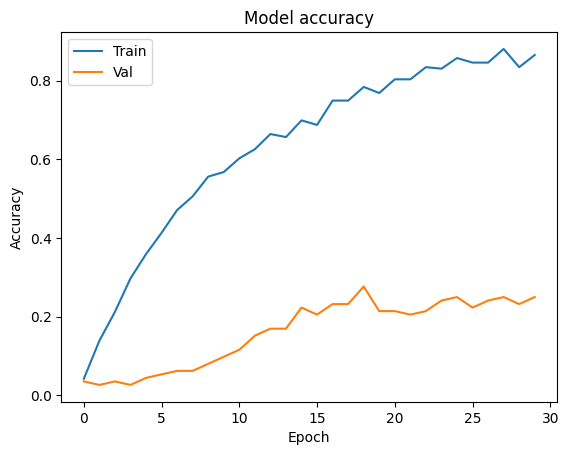

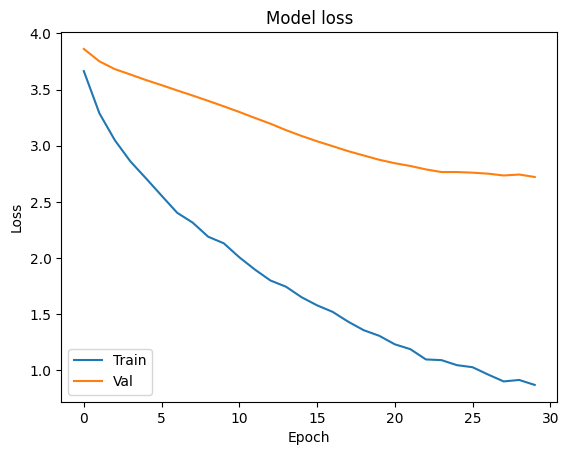

In [31]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower left')
plt.show()


Kao rezultat treninga ResNet50 mreže, dolazimo do toga da je tačnost na trening podacima zadovoljavajuća, dok na validacionim podacima bi trebalo da bude mnogo bolja. Model bi se mogao poboljšati dodavanjem još epoha, da bi mogao još bolje da istrenira, jer vidimo da se tačnost na validacionom skupu ipak povećava vremenom kako se model trenira na većem broju epoha.
Gubitak se značajno smanjuje na trening skupu podataka, dok ponovo kod validacionih podataka vidimo da se smanjuje, ali mnogo slabije.

Pošto rezultati korištenja ResNet50 mreže i nisu najbolji, koristićemo i DenseNet121 mrežu na istom skupu podataka da vidimo kakve će rezultate treniranje ove mreže dati.

<h1> <b>DenseNet121

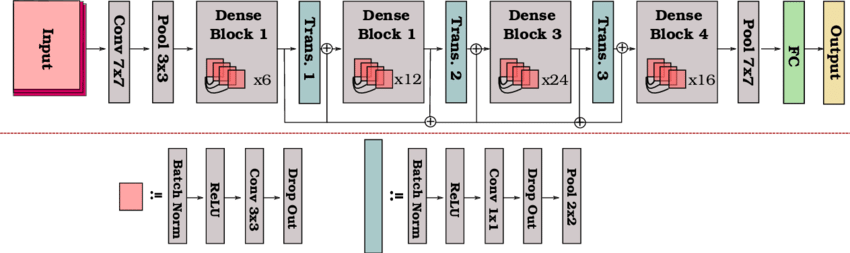

**DenseNet121** je arhitektura duboke neuronske mreže (deep neural network) koja se koristi za klasifikaciju slika. Ova arhitektura je nazvana "DenseNet" zbog svoje karakteristične gusto povezane (dense) strukture.

**DenseNet** arhitektura je posebna vrsta **konvolucijske neuronske mreže (CNN)**koja ima slojeve koji su međusobno povezani, omogućavajući prolaz informacija iz jednog sloja u sve ostale slojeve. Ovo se postiže konceptom zvanim "skip connections" ili "residual connections", gdje izlaz svakog sloja nije samo ulaz sljedećem sloju, već se dodaje i kao ulaz svim budućim slojevima.

**DenseNet121** je poseban varijant DenseNet arhitekture koji ima ukupno 121 sloj. Ova arhitektura je trenirana na velikim skupovima podataka, kao što je ImageNet.

Prvo je potrebno instancirati model ove mreže. Zatim, dodajemo Dropout sloj s vjerovatnoćom odbacivanja (dropout rate) od 0.5 na izlazni sloj koji je drugi sloj od kraja u originalnom DenseNet121 modelu. Dropout sloj sprečava pretreniranost modela.(overfitting).
Takođe, dodajemo potpuno povezani sloj (Dense) s brojem izlaznih neurona jednakim broju klasa(38) i aktivacijskom funkcijom **softmax**.
Posljednji dio ove ćelije, odnosi se na kompajliranje samog modela.

In [32]:

from tensorflow.keras.applications import DenseNet121
dense_net = tf.keras.applications.DenseNet121()

dense_net_layer=Dropout(0.5)(dense_net.layers[-2].output)
number_of_classes = len(data['class_id'].unique())

last_layer = Dense(number_of_classes, activation="softmax")(dense_net_layer)
model = Model(dense_net.input, last_layer)

model.compile(loss='sparse_categorical_crossentropy',
              optimizer=Adam(0.0001),
              metrics=['accuracy'])


33188688/33188688 [==============================] - 2s 0us/step


Slijedi trening modela na podacima sa kojima mi raspolažemo. Izbor je pao na 20 epoha, što se pokazalo sasvim dovoljno da bismo dobili željene rezultate.
Dodat je i early_stopping mehanizam u cilju optimizacije modela.

In [33]:
hist=model.fit(
    x_train_converted,
    y_train_converted,
    epochs=20,
    validation_data=(x_val_converted, y_val_converted),
    shuffle=True,
    batch_size=10,
    callbacks=[early_stopping]
)

Epoch 1/20
26/26 [==============================] - 293s 9s/step - loss: 4.4752 - accuracy: 0.0386 - val_loss: 3.7884 - val_accuracy: 0.0625
Epoch 2/20
26/26 [==============================] - 237s 9s/step - loss: 2.6929 - accuracy: 0.2934 - val_loss: 2.8309 - val_accuracy: 0.2589
Epoch 3/20
26/26 [==============================] - 234s 9s/step - loss: 1.5370 - accuracy: 0.6293 - val_loss: 2.2015 - val_accuracy: 0.4643
Epoch 4/20
26/26 [==============================] - 225s 9s/step - loss: 0.9698 - accuracy: 0.8301 - val_loss: 1.8058 - val_accuracy: 0.5982
Epoch 5/20
26/26 [==============================] - 223s 9s/step - loss: 0.6065 - accuracy: 0.9228 - val_loss: 1.5378 - val_accuracy: 0.6964
Epoch 6/20
26/26 [==============================] - 221s 9s/step - loss: 0.4312 - accuracy: 0.9846 - val_loss: 1.2985 - val_accuracy: 0.7768
Epoch 7/20
26/26 [==============================] - 222s 9s/step - loss: 0.2632 - accuracy: 0.9923 - val_loss: 1.1730 - val_accuracy: 0.7857
Epoch 8/20
26

Zatim, slijedi prikazivanje slika iz testnog skupa zajedno sa predikcijama modela.
Slika se smanjuje na veličinu 224x224 piksela i konvertuje iz BGR u RGB format.

Normalizacija slike se izvodi dijeljenjem sa 255 kako bi se vrijednosti piksela skalirale od 0 do 1.

Slika se pretvara u oblik (1, 224, 224, 3) kako bi se pravilno predala modelu za predikciju.

Zatim se koristi model.predict da se izvrši predikcija i dobije indeks klase kojem slika pripada, a na osnovu tog indeksa pronalazimo naziv date figure iz madatada_data.

1/1 [==============================] - 0s 370ms/step


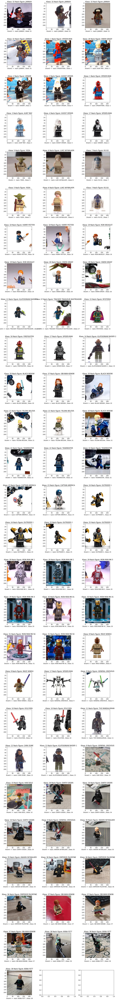

In [34]:

import matplotlib.pyplot as plt

fig, axs = plt.subplots(len(test) // 3 + 1, 3, figsize=(15, 5 * (len(test) // 3 + 1)))

for i in range(len(test)):
    image = cv2.imread(x_test['path'].values[i])
    image = cv2.resize(image, dsize=(224, 224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) / 255
    axs[i // 3, i % 3].imshow(image)
    axs[i // 3, i % 3].set_xlabel('Stvarni ->  naziv: ' + test_actual['minifigure_name'].values[i] +
                                   ' , klasa: ' + str(test_actual['class_id'].values[i]))
    image = np.reshape(image, (1, 224, 224, 3))
    ans = model.predict(image).argmax()
    ans = ans + 1
    minifigure = metadata_data["minifigure_name"][metadata_data["class_id"] == ans].iloc[0]
    axs[i // 3, i % 3].set_title("Klasa: " + str(ans) + " Naziv figure: " + minifigure)


for i in range(len(test), len(test) // 3 + 1 * 3):
    axs[i // 3, i % 3].axis('off')

plt.subplots_adjust(hspace=0.5)
plt.show()


Za sam kraj provjera kolika je tačnost, a koliki gubitak na validacionim podacima koji smo dobili nakon treniranja modela na ovoj mreži.

In [35]:
loss, accuracy = model.evaluate(x_val_converted, y_val_converted, verbose=1)

print('Test loss:', loss)
print('Test accuracy:', accuracy)

4/4 [==============================] - 19s 4s/step - loss: 0.6654 - accuracy: 0.8214
Test loss: 0.6654186248779297
Test accuracy: 0.8214285969734192


## **Zaključak**
Na osnovu treniranja modela pomoću DenseNet121 dobijamo itekako zadovoljavajuće rezultate jer naš model uspješno vrši predikciju i dodjeljuje nazive figura, odnosno klase na osnovu slika iz testnog skupa. Takođe, same vrijednosti koje se odnose na tačnost predikcije i gubitak su na zadovoljavajućem nivou, gdje tačnost koja se odnosi na validacioni skup prelazi 0.8.

Vodeći se rezultatima dobijenim ovim istraživanjem, vidimo da se bolji rezultati dobiju kada se koristi DenseNet121 mreža, uzimajući u obzir naš početni set podataka, kao i vrijednosti ostalih parametara koje smo mi sami odredili.

Rezultati dobijeni treningom ResNet50 bi sigurno bili mnogo bolji da je broj epoha povećan, odnosno da je trening produžen. Međutim, za manji broj epoha rezultati kod DenseNet121 su bolji.

Ono što bi još poboljšalo rezultate jeste i opcija uvođenja augmentacije podataka koja bi značajno povećala skup za trening. U okviru jedne ćelije se nalazi kod za augmentaciju koji nisam uspjela uspješno da realizujem.

Rad na ovom projektu je bio zanimljiv i izazovan, jer sam pokušavala da mijenjam vrijednosti različitih parametara u potrazi za što boljim rezultatima. Ovi rezultati do kojih sam na kraju došla su bili najbolja opcija s obzirom na ponuđene podatke i dostupne resurse.

# **Reference**

1.https://www.activestate.com/resources/quick-reads/what-is-pandas-in-python-everything-you-need-to-know/

2.https://keras.io/api/callbacks/early_stopping/

3.https://pytorch.org/hub/pytorch_vision_densenet/

4.https://datagen.tech/guides/computer-vision/resnet-50/

5.https://pandas.pydata.org/

6.https://www.tensorflow.org/

7.https://en.wikipedia.org/wiki/Python_Imaging_Library
